# Logic Tensor Network for Music Emotion Recognition

**Project in State-of-the-Art of AI Research<br>TSFS22**

---
Jonatan Linberg<br>
__[lijo21rf@student.ju.se](mailto:lijo21rf@student.ju.se)__

---
## Summary
* [Loading the data](#Dataset)
* [Creating the models](#Models)
* [Training](#Training)
* [Evaluation](#Evaluation)

In [1]:
import ltn
import time
import numpy as np
import pandas as pd
import tensorflow as tf
import sounddevice as sd
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from IPython.display import Audio
from tensorflow.keras import layers

2023-02-16 11:52:34.547993: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


NotFoundError: dlopen(/Users/jonatanlinberg/.pyenv/versions/$/lib/python3.10/site-packages/tensorflow-plugins/libmetal_plugin.dylib, 0x0006): symbol not found in flat namespace (__ZN10tensorflow8internal10LogMessage16VmoduleActivatedEPKci)

In [2]:
BATCH_SIZE = 128
BUFFER_SIZE = 60 * 300   # 300 songs per shuffle-buffer
ENCODER_SIZE = 32

INPUT_SHAPE = (None, 22050, 1) # 0.5 sec at 44.1hz, mono

VAL_SPLIT = 0.2

SAMPLE_RATE = 44100
audio_path  = 'dataset/audio'

LABEL_RATE  = 2
label_path  = 'dataset/DEAM_Annotations/annotations/annotations averaged per song/dynamic (per second annotations)'

# this variable is probably stupid
EMOTION = {'happy':0, 'tense':1, 'sombre':2, 'relaxed':3, 0:'happy', 1:'tense', 2:'sombre', 3:'relaxed'}

---
# Dataset

## Load Audio Data

In [3]:
ds_audio_train = tf.keras.utils.audio_dataset_from_directory(
    audio_path,
    labels=None,
    batch_size=None,
    shuffle=False,
    seed=None,
    validation_split=VAL_SPLIT,
    subset='training',
    output_sequence_length=(45 * SAMPLE_RATE), # 45 seconds
    follow_links=True
)

ds_audio_val = tf.keras.utils.audio_dataset_from_directory(
    audio_path,
    labels=None,
    batch_size=None,
    shuffle=False,
    seed=None,
    validation_split=VAL_SPLIT,
    subset='validation',
    output_sequence_length=(45 * SAMPLE_RATE), # 45 seconds
    follow_links=True
)

Found 1802 files belonging to 1 classes.
Using 1442 files for training.


2023-02-14 14:27:20.669443: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Found 1802 files belonging to 1 classes.
Using 360 files for validation.


## Audio Preprocessing

### Skip first 15 seconds
The first 15 seconds have not been annotated. They could still be useful to the model since they could affect the emotion of the annotated samples, but for now they are not included. 

In [4]:
_15_SEC_SKIP = 15*SAMPLE_RATE

def skip15sec(data):
    return data[_15_SEC_SKIP:]

### Make mono

In [5]:
def to_mono(data):
    return data[...,0] # take first channel

### Reshape data to match labels
`(LABEL_RATE * length_seconds, SAMPLE_RATE/LABEL_RATE, n_channels)`

In [6]:
def reshape_data(data):
    if (len(data) == 0):
        return data
    n_channels = 1
    return tf.reshape(data, (LABEL_RATE * 30, SAMPLE_RATE//LABEL_RATE, n_channels))

### Map preprocessing to dataset

In [7]:
ds_audio_train = ds_audio_train.map(skip15sec)
ds_audio_train = ds_audio_train.map(to_mono)
ds_audio_train = ds_audio_train.map(reshape_data)

ds_audio_val = ds_audio_val.map(skip15sec)
ds_audio_val = ds_audio_val.map(to_mono)
ds_audio_val = ds_audio_val.map(reshape_data)

### Unbatch reshaped data so each "batch” is 0.5 seconds long
(I cannot believe this actually worked, tensorflow is magic)

In [8]:
ds_audio_train = ds_audio_train.unbatch()
ds_audio_val = ds_audio_val.unbatch()

### Check audio data

In [45]:
for a in ds_audio_train.skip(330).take(10):
    #print(np.min(a.numpy()), np.max(a.numpy()))
    sd.play(a, samplerate=SAMPLE_RATE, blocking=True)
    sd.stop()
    #time.sleep(0.2)

Audio file for comparison (beginning at 15 seconds)

In [33]:
Audio(f'{audio_path}/0008.wav', rate=44100)

## Load Labels

In [11]:
ds_valence = pd.read_csv(f"{label_path}/valence.csv")
ds_valence = ds_valence.dropna(axis=1)
ds_valence = ds_valence.drop(columns='song_id')
ds_valence

,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,sample_19500ms,...,sample_40000ms,sample_40500ms,sample_41000ms,sample_41500ms,sample_42000ms,sample_42500ms,sample_43000ms,sample_43500ms,sample_44000ms,sample_44500ms
0,-0.073341,-0.074661,-0.074077,-0.078154,-0.081588,-0.080873,-0.083611,-0.082145,-0.081632,-0.083874,...,-0.317376,-0.324846,-0.324680,-0.328112,-0.330134,-0.330134,-0.331164,-0.331769,-0.334287,-0.333846
1,-0.189702,-0.187765,-0.183740,-0.188761,-0.193704,-0.190834,-0.189041,-0.197554,-0.202871,-0.209757,...,-0.302453,-0.313982,-0.305432,-0.294850,-0.282940,-0.276367,-0.279427,-0.278662,-0.274248,-0.270162
2,0.154286,0.148063,0.146956,0.151180,0.135942,0.076832,0.084487,0.088513,0.090944,0.085544,...,0.217544,0.217568,0.218895,0.222275,0.190338,0.173086,0.174892,0.179884,0.182710,0.179332
3,0.149053,0.148260,0.147369,0.146956,0.147857,0.146927,0.145651,0.145795,0.146420,0.152565,...,0.132608,0.133477,0.133477,0.134290,0.133555,0.134592,0.134347,0.133955,0.133477,0.133477
4,0.342816,0.345193,0.332023,0.328887,0.327603,0.329011,0.327883,0.334822,0.328447,0.344121,...,0.349402,0.327612,0.330913,0.331320,0.301550,0.295276,0.295031,0.319244,0.316518,0.321731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1797,0.088000,0.088000,0.086000,0.080000,0.070000,0.068000,0.076000,0.078000,0.074000,0.074000,...,0.120000,0.118000,0.116000,0.118000,0.120000,0.122000,0.120000,0.120000,0.120000,0.116000
1798,0.128000,0.098000,0.080000,0.080000,0.088000,0.088000,0.086000,0.078000,0.068000,0.066000,...,0.026000,0.038000,0.038000,0.034000,0.010000,0.016000,0.018000,0.018000,0.016000,0.016000
1799,0.198000,0.182000,0.164000,0.156000,0.148000,0.142000,0.144000,0.146000,0.160000,0.168000,...,0.154000,0.156000,0.152000,0.144000,0.146000,0.156000,0.162000,0.152000,0.138000,0.136000
1800,-0.071667,-0.061667,-0.076667,-0.078333,-0.081667,-0.046667,-0.046667,-0.068333,-0.113333,-0.133333,...,-0.215000,-0.191667,-0.190000,-0.188333,-0.188333,-0.191667,-0.191667,-0.191667,-0.191667,-0.193333


In [12]:
ds_arousal = pd.read_csv(f"{label_path}/arousal.csv")
ds_arousal = ds_arousal.dropna(axis=1)
ds_arousal = ds_arousal.drop(columns='song_id')
#ds_arousal

In [13]:
np.array([ds_arousal.values[i] for i in range(ds_arousal.shape[0])]).shape

(1802, 60)

### Binning
To be able to write predicates that evaluate to True|False, the data needs to be categorical. Ideally, the data would have attributes like chord, tempo, dynamics etc. that would make this a bit more interesting and informative.


In this project the predicates will simply divide the valence and arousal regression into smaller classification tasks. For instance, instead of predicting `valence(x) = 0.7` we may have a predicate `high_valence(x) = True`.

---
#### Bins:
2 bins per attribute, below and above 0. Low and high thresholds are the same to match the class labels. 

[//]: #more_old_bins "
3 bins per attribute, low|med|high, divided based on two thresholds:<br>
$\alpha_{low} = -0.15$<br>
$\alpha_{high} = 0.15$"

[//]: #OLD_BINS "
low = $x < m-0.5s$<br>
med = $m-0.5s < x < m+0.5s$<br>
high = $m+0.5s < x$<br>
Where $m$ is the mean and $s$ is the standard deviation. This results in most instances either being classed as high or low, which is more informative than med. "

In [14]:
def bin_attribute(data, th_low=-0.15, th_high=0.15):
    data = data.copy() # not really necessary
    low  = data < th_low
    med  = (data >= th_low) & (data <= th_high)
    high = data > th_high
    return low, med, high

In [15]:
aro_low, aro_mid, aro_high = bin_attribute(ds_arousal, th_low=0, th_high=0) # mid will be empty
val_low, val_mid, val_high = bin_attribute(ds_valence, th_low=0, th_high=0)

aro_low = np.array(aro_low).flatten()
aro_mid = np.array(aro_mid).flatten()
aro_high = np.array(aro_high).flatten()
df_aro = np.stack([aro_low, aro_mid, aro_high], axis=1)

val_low = np.array(val_low).flatten()
val_mid = np.array(val_mid).flatten()
val_high = np.array(val_high).flatten()
df_val = np.stack([val_low, val_mid, val_high], axis=1)

### Emotion Categorisation
Based on the valence-arousal space, the data is divided into four basic "emotions", each defining one quadrant: *Happy*, upper right; *Tense*, upper left; *Sombre*, lower left; and *Relaxed*, lower right. A diagram of the space can be seen in the below image [[1]](#References).

![VA_diagram](https://www.researchgate.net/profile/Lung-Hao-Lee-2/publication/304124018/figure/fig1/AS:374864755085312@1466386130906/Two-dimensional-valence-arousal-space.png)

In [16]:
# emotion class labels (song, sample (label-rate), emotion_class)
def categorise_emotion(arousal, valence):
    arousal = np.array(arousal, copy=True)
    valence = np.array(valence, copy=True)
    n_emo = 4
    shape = arousal.shape
    
    out = np.zeros((*shape,), dtype=int)
    for i in range(shape[0]):
        for j in range(shape[1]):
            if (arousal[i,j] >= 0):
                if (valence[i,j] >= 0):
                    out[i,j] = EMOTION['happy']      # 0 == Happy
                else:
                    out[i,j] = EMOTION['tense']      # 1 == Tense
            else:
                if (valence[i,j] >= 0):
                    out[i,j] = EMOTION['relaxed']      # 3 == Relaxed
                else:
                    out[i,j] = EMOTION['sombre']      # 2 == Sombre
    return out

In [17]:
df_emo = categorise_emotion(ds_arousal, ds_valence)
n, s, *e = df_emo.shape
df_emo = np.reshape(df_emo, (n*s, *e))
df_emo.shape

(108120,)

### Split train/val

In [18]:
train_index = len(ds_audio_train)
ds_emo_train = tf.data.Dataset.from_tensor_slices(df_emo.astype(int)[:train_index])
ds_emo_val = tf.data.Dataset.from_tensor_slices(df_emo.astype(int)[train_index:])

ds_val_train = tf.data.Dataset.from_tensor_slices(df_val.astype(bool)[:train_index])
ds_val_val = tf.data.Dataset.from_tensor_slices(df_val.astype(bool)[train_index:])

ds_aro_train  = tf.data.Dataset.from_tensor_slices(df_aro.astype(bool)[:train_index])
ds_aro_val  = tf.data.Dataset.from_tensor_slices(df_aro.astype(bool)[train_index:])

## Combine audio and labels

In [19]:
def zip_and_prepare_datasets(datasets, shuffle_buffer=60*100, batch_size=32):
    ds = tf.data.Dataset.zip(datasets)
    ds = ds.shuffle(shuffle_buffer, seed=42, reshuffle_each_iteration=True)
    ds = ds.batch(batch_size)
    return ds

ds_train_bl  = zip_and_prepare_datasets(
    (ds_audio_train, ds_emo_train),
    batch_size=BATCH_SIZE,
    shuffle_buffer = BUFFER_SIZE
)
ds_val_bl    = zip_and_prepare_datasets(
    (ds_audio_val, ds_emo_val),
    batch_size=BATCH_SIZE,
    shuffle_buffer = BUFFER_SIZE
)

ds_train_ltn = zip_and_prepare_datasets(
    (ds_audio_train, ds_val_train, ds_aro_train, ds_emo_train),
    batch_size=BATCH_SIZE,
    shuffle_buffer = BUFFER_SIZE
)
ds_val_ltn   = zip_and_prepare_datasets(
    (ds_audio_val, ds_val_val, ds_aro_val, ds_emo_val),
    batch_size=BATCH_SIZE,
    shuffle_buffer = BUFFER_SIZE
)

In [20]:
for a, *e in ds_train_ltn.take(1):
    for i in range(5):
        print(EMOTION[e[2][i].numpy()])
        print([l[i].numpy() for l in e])
        sd.play(a[i], samplerate=SAMPLE_RATE, blocking=True)
        sd.stop()
        time.sleep(0.2)

happy
[array([False, False,  True]), array([False, False,  True]), 0]
happy
[array([False, False,  True]), array([False, False,  True]), 0]
relaxed
[array([False, False,  True]), array([ True, False, False]), 3]
happy
[array([False, False,  True]), array([False, False,  True]), 0]
happy
[array([False, False,  True]), array([False, False,  True]), 0]


---
# Models

## Audio Encoder
1D Convolutional block with residual connection, based on [[2]](#References).
Initial layer kernel should be ~10ms, with 44.1khz sample rate that is 441, in the paper they first downsample the audio to reduce computational resources needed. 

In [21]:
class InputBlock(layers.Layer):
    def __init__(self, filters, k_size=441, stride=4, pool_factor=4):
        super().__init__()
        self.conv1 = layers.Conv1D(filters, k_size, strides=stride, padding='same')
        self.bn1 = layers.BatchNormalization()
        self.activation = layers.ReLU()
        self.mpool = layers.MaxPooling1D(pool_factor, strides=pool_factor)
        
    def call(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.activation(x)
        x = self.mpool(x)
        return x

class ResBlock(layers.Layer):
    def __init__(self, filters, k_size=3, pool_factor=1):
        super().__init__()
        self.conv1 = layers.Conv1D(filters, k_size, strides=1, padding='same')
        self.bn1 = layers.BatchNormalization()
        self.conv2 = layers.Conv1D(filters, k_size, strides=1, padding='same')
        self.bn2 = layers.BatchNormalization()

        self.activation = layers.ReLU()
        self.project_residual = layers.Conv1D(filters, 1, strides=1, padding='same')
        self.mpool = layers.MaxPooling1D(pool_factor, strides=pool_factor, padding='same')
        self.add = layers.Add()

    def call(self, x):
        res = x
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.activation(x)
        res = self.project_residual(res)
        x = self.add([x, res])
        x = self.mpool(x)
        return x

In [22]:
def make_head(n_classes=4, mutually_exclusive=True, hidden_layers=(16,)):  # dense + softmax
    if mutually_exclusive:
        activation = 'softmax'
    else:
        activation = 'sigmoid'
    return tf.keras.Sequential([
        *[layers.Dense(l, activation='relu') for l in hidden_layers],
        layers.Dense(n_classes, activation=activation)
    ])

def make_m33_enc(include_head=False):  # m34 but only 1 conv in input layer
    model = tf.keras.Sequential([
        InputBlock(48, k_size=80), # [80, 48]
        ResBlock(48), # [3, 48] x6
        ResBlock(48),
        ResBlock(48, pool_factor=4),
        ResBlock(96), # [3, 96] x8
        ResBlock(96),
        ResBlock(96),
        ResBlock(96, pool_factor=4),
        ResBlock(192), # [3, 192] x12
        ResBlock(192),
        ResBlock(192),
        ResBlock(192),
        ResBlock(192),
        ResBlock(192, pool_factor=4),
        ResBlock(384), #  [3, 384] x 6
        ResBlock(384),
        ResBlock(384, pool_factor=4),
        layers.GlobalAveragePooling1D()
    ])
    if (include_head):
        model.add(make_head())
    return model


def make_small_enc(include_head=False, size=32): # kind-of m9; ~same acc as m34 for 5 epochs without any tuning
    model = tf.keras.Sequential([
        InputBlock(size, k_size=441),  # 441 == 10ms
        ResBlock(size, pool_factor=4),
        ResBlock(size*2, pool_factor=4),
        ResBlock(size*4, pool_factor=4),
        ResBlock(size*8, pool_factor=4),
        layers.GlobalAveragePooling1D()
    ])
    if (include_head):
        model.add(make_head())
    return model


baseline = make_small_enc(include_head=True, size=ENCODER_SIZE)

baseline.build(INPUT_SHAPE)
baseline.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_block (InputBlock)    (None, 1378, 32)          14272     
                                                                 
 res_block (ResBlock)        (None, 345, 32)           7520      
                                                                 
 res_block_1 (ResBlock)      (None, 87, 64)            21184     
                                                                 
 res_block_2 (ResBlock)      (None, 22, 128)           83328     
                                                                 
 res_block_3 (ResBlock)      (None, 6, 256)            330496    
                                                                 
 global_average_pooling1d (G  (None, 256)              0         
 lobalAveragePooling1D)                                          
                                                        

## Logic Tensor Network

### Predicates:
**Emotion class predicates:**  
$E = \{Happy, Tense, Sombre, Relaxed\}$  

**Valence and arousal predicates:**  
(Thresholds $\theta_{low} = 0$ and $\theta_{high} = 0$)  
$\begin{align}
    V_{low}(x) \;\;& \equiv\;\; x.valence < \theta_{low} \\
    V_{med}(x) \;\;& \equiv\;\; \theta_{low} ≤ x.valence ≤ \theta_{high} \\
    V_{high}(x) \;\;& \equiv\;\; \theta_{high} < x.valence \\
    A_{low}(x) \;\;& \equiv\;\; x.arousal < \theta_{low} \\
    A_{med}(x) \;\;& \equiv\;\; \theta_{low} ≤ x.arousal ≤\theta_{high} \\
    A_{high}(x) \;\;& \equiv\;\; \theta_{high} < x.arousal \\
\end{align}$


**Knowledge base:**  
$
\begin{align}
\forall_{x}&(V_{high}(x) \;\land\; A_{high}(x) \implies E_1(x)) \\
\forall_{x}&(V_{low}(x) \;\land\; A_{high}(x) \implies E_2(x)) \\
\forall_{x}&(V_{low}(x) \;\land\; A_{low}(x) \implies E_3(x)) \\
\forall_{x}&(V_{high}(x) \;\land\; A_{low}(x) \implies E_4(x)) \\
\forall_{x}&(\lnot(V_{low}(x) \land V_{high}(x)))\\
\forall_{x}&(\lnot(A_{low}(x) \land A_{high}(x)))\\
\forall_{x, e \in \mathrm{E}, f \in \mathrm{E} \setminus{e}}&(\lnot(e(x) \land f(x))) \\
\end{align}
$

**rewritten KB:**  
$\begin{align}
\forall_{x}(V_{high}(x) &\implies (E_1(x) \lor E_4(x)) \land \lnot(E_2(x) \lor E_3(x))) \\
\end{align}
$

In [92]:
Not = ltn.Wrapper_Connective(ltn.fuzzy_ops.Not_Std())
And = ltn.Wrapper_Connective(ltn.fuzzy_ops.And_Prod())
Or = ltn.Wrapper_Connective(ltn.fuzzy_ops.Or_ProbSum())
Implies = ltn.Wrapper_Connective(ltn.fuzzy_ops.Implies_Reichenbach())
Forall = ltn.Wrapper_Quantifier(ltn.fuzzy_ops.Aggreg_pMeanError(p=2),semantics="forall")
Exists = ltn.Wrapper_Quantifier(ltn.fuzzy_ops.Aggreg_pMean(p=2),semantics="exists")
formula_aggregator = ltn.Wrapper_Formula_Aggregator(ltn.fuzzy_ops.Aggreg_pMeanError(p=2))

class LTN_Model(tf.keras.Model):
    def __init__(self):
        super(LTN_Model, self).__init__()
        
        self.train_sat_kb = tf.keras.metrics.Mean(name='train_sat_kb')
        self.test_sat_kb = tf.keras.metrics.Mean(name='test_sat_kb')
        self.train_emo_acc = tf.keras.metrics.Mean(name="train_emo_acc")
        self.test_emo_acc = tf.keras.metrics.Mean(name="test_emo_acc")
        
        # models
        self.encoder = make_small_enc(include_head=False, size=ENCODER_SIZE)
        self.encoder.build(INPUT_SHAPE)
        
        feature_dim = self.encoder.output_shape
        
        # 8 classes: 4 emotion + high/low val & aro
        self.classifier = make_head(n_classes=8, mutually_exclusive=False)
        self.classifier.build(feature_dim)
        self.p = ltn.Predicate(ltn.utils.LogitsToPredicateModel(self.classifier,single_label=False))
        
        self.emo_i = {
            'happy': ltn.Constant(EMOTION['happy'], trainable=False),
            'tense': ltn.Constant(EMOTION['tense'], trainable=False),
            'sombre': ltn.Constant(EMOTION['sombre'], trainable=False),
            'relaxed': ltn.Constant(EMOTION['relaxed'], trainable=False)
        }
        self.val_i = {
            'low':ltn.Constant(4, trainable=False),
            'high': ltn.Constant(5, trainable=False)
        }
        self.aro_i = {
            'low':ltn.Constant(6, trainable=False),
            'high':ltn.Constant(7, trainable=False)
        }
        
    @property
    def metrics(self):
        return [
            self.train_sat_kb, 
            self.test_sat_kb,
            self.train_emo_acc,
            self.test_emo_acc
        ]
        
    @tf.function
    def train_step(self, data):
        audio, label_val, label_aro, label_emo = data
        # sat and update
        with tf.GradientTape() as tape:
            features = self.encoder(audio)
            sat = self.axioms(features, label_val, label_aro, label_emo)
            loss = 1.-sat
        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.train_sat_kb.update_state(sat)
        emo_pred, _, _ = tf.split(self.classifier(features), [4, 2, 2], axis=-1)
        self.train_emo_acc.update_state(
            tf.keras.metrics.sparse_categorical_accuracy(label_emo, emo_pred))
        return {
            'sat': self.train_sat_kb.result(),
            'emo_acc': self.train_emo_acc.result()
        }
    
    @tf.function
    def test_step(self, data):
        audio, label_val, label_aro, label_emo = data
        features = self.encoder(audio)
        sat = self.axioms(features, label_val, label_aro, label_emo)
        emo_pred, _, _ = tf.split(self.classifier(features), [4, 2, 2], axis=-1)
        self.test_sat_kb.update_state(sat)
        self.test_emo_acc.update_state(
            tf.keras.metrics.sparse_categorical_accuracy(label_emo, emo_pred))
        return {
            'sat': self.test_sat_kb.result(),
            'emo_acc': self.test_emo_acc.result()
        }
        
    @tf.function
    def call(self, x):
        x = self.encoder(x)
        x = self.classifier(x)
        emo, val, aro = tf.split(x, [4, 2, 2], axis=-1)
        return [emo, val, aro]

    @tf.function
    def axioms(self, data, label_val, label_aro, label_emo):
        x = ltn.Variable('x', data)
        
        # variables
        x_emo_happy = ltn.Variable('x_emo_happy', data[label_emo==EMOTION['happy']]) 
        x_emo_tense = ltn.Variable('x_emo_tense', data[label_emo==EMOTION['tense']])
        x_emo_sombre = ltn.Variable('x_emo_sombre', data[label_emo==EMOTION['sombre']])
        x_emo_relaxed = ltn.Variable('x_emo_relaxed', data[label_emo==EMOTION['relaxed']])
        x_val_high = ltn.Variable('x_val_high', data[label_val[2]])
        x_val_low  = ltn.Variable('x_val_low',  data[label_val[0]])
        x_aro_high = ltn.Variable('x_aro_high', data[label_aro[2]])
        x_aro_low  = ltn.Variable('x_aro_low',  data[label_aro[0]])
        
        axioms = [
            # class satisfaction
            Forall(x_emo_happy,  self.p([x_emo_happy,  self.emo_i['happy']])),
            Forall(x_emo_tense,  self.p([x_emo_tense,  self.emo_i['tense']])),
            Forall(x_emo_sombre, self.p([x_emo_sombre, self.emo_i['sombre']])),
            Forall(x_emo_relaxed,self.p([x_emo_relaxed,self.emo_i['relaxed']])),
            Forall(x_val_high, self.p([x_val_high, self.val_i['high']])),
            Forall(x_val_low,  self.p([x_val_low,  self.val_i['low']])),
            Forall(x_aro_high, self.p([x_aro_high, self.aro_i['high']])),
            Forall(x_aro_low,  self.p([x_aro_low,  self.aro_i['low']])),
            
            # knowledge base satisfaction
            Forall(x, Implies(
                And(
                    self.p([x, self.val_i['high']]), 
                    self.p([x, self.aro_i['high']])
                ),
                self.p([x, self.emo_i['happy']])
            )),
            Forall(x, Implies(
                And(
                    self.p([x, self.val_i['low']]), 
                    self.p([x, self.aro_i['high']])
                ),
                self.p([x, self.emo_i['tense']])
            )),
            Forall(x, Implies(
                And(
                    self.p([x, self.val_i['low']]), 
                    self.p([x, self.aro_i['low']])
                ),
                self.p([x, self.emo_i['sombre']])
            )),
            Forall(x, Implies(
                And(
                    self.p([x, self.val_i['high']]), 
                    self.p([x, self.aro_i['low']])
                ),
                self.p([x, self.emo_i['relaxed']])
            )),
            
            # mutually exclusive
            Forall(x, Not(And(self.p([x,self.val_i['high']]), self.p([x,self.val_i['low']])))),
            Forall(x, Not(And(self.p([x,self.aro_i['high']]), self.p([x,self.aro_i['low']])))),
            Forall(x, Not(And(self.p([x,self.emo_i['happy']]), self.p([x,self.emo_i['tense']])))),
            Forall(x, Not(And(self.p([x,self.emo_i['happy']]), self.p([x,self.emo_i['sombre']])))),
            Forall(x, Not(And(self.p([x,self.emo_i['happy']]), self.p([x,self.emo_i['relaxed']])))),
            Forall(x, Not(And(self.p([x,self.emo_i['tense']]), self.p([x,self.emo_i['sombre']])))),
            Forall(x, Not(And(self.p([x,self.emo_i['tense']]), self.p([x,self.emo_i['relaxed']])))),
            Forall(x, Not(And(self.p([x,self.emo_i['sombre']]), self.p([x,self.emo_i['relaxed']])))),
        ]
        sat_level = formula_aggregator(axioms).tensor
        return sat_level

---
# Training

## Batch History Callback

In [90]:
class BatchHistory(tf.keras.callbacks.Callback):
    def __init__(self):
        super(BatchHistory, self).__init__()
        self.columns = None
        self.history = None
        
    def on_train_batch_end(self, batch, logs=None):
        keys = logs.keys()
        if (self.history is None):
            self.columns = keys
            self.history = np.zeros((len(keys),0))
        self.history = np.append(self.history, [[logs[key]] for key in keys], axis=1)

## Baseline Model

In [28]:
baseline.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=tf.keras.metrics.SparseCategoricalAccuracy()
)
bl_bhist = BatchHistory()

baseline.fit(ds_train_bl, epochs=5, validation_data=ds_val_bl, callbacks=[bl_bhist])

Epoch 1/5
676/676 [==============================] - 1402s 2s/step - loss: 0.9295 - sparse_categorical_accuracy: 0.6373 - val_loss: 1.0810 - val_sparse_categorical_accuracy: 0.5931
Epoch 2/5
676/676 [==============================] - 1365s 2s/step - loss: 0.8920 - sparse_categorical_accuracy: 0.6535 - val_loss: 1.0429 - val_sparse_categorical_accuracy: 0.6063
Epoch 3/5
676/676 [==============================] - 1342s 2s/step - loss: 0.8659 - sparse_categorical_accuracy: 0.6624 - val_loss: 1.1623 - val_sparse_categorical_accuracy: 0.6069
Epoch 4/5
676/676 [==============================] - 1336s 2s/step - loss: 0.8440 - sparse_categorical_accuracy: 0.6690 - val_loss: 1.0585 - val_sparse_categorical_accuracy: 0.5985
Epoch 5/5
676/676 [==============================] - 1327s 2s/step - loss: 0.8245 - sparse_categorical_accuracy: 0.6777 - val_loss: 1.1075 - val_sparse_categorical_accuracy: 0.5998


## LTN Model

In [93]:
ltn_model = LTN_Model()
ltn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3)
)

ltn_bhist = BatchHistory()
ltn_model.fit(ds_train_ltn, epochs=5, validation_data=ds_val_ltn, callbacks=[ltn_bhist])

Epoch 1/5
676/676 [==============================] - 1233s 2s/step - sat: 0.6623 - emo_acc: 0.4072 - val_sat: 0.6614 - val_emo_acc: 0.4986
Epoch 2/5
676/676 [==============================] - 1162s 2s/step - sat: 0.6657 - emo_acc: 0.4689 - val_sat: 0.6595 - val_emo_acc: 0.3036
Epoch 3/5
676/676 [==============================] - 1151s 2s/step - sat: 0.6659 - emo_acc: 0.4634 - val_sat: 0.6612 - val_emo_acc: 0.3715
Epoch 4/5
676/676 [==============================] - 1149s 2s/step - sat: 0.6663 - emo_acc: 0.4714 - val_sat: 0.6616 - val_emo_acc: 0.3299
Epoch 5/5
676/676 [==============================] - 1163s 2s/step - sat: 0.6666 - emo_acc: 0.4819 - val_sat: 0.6636 - val_emo_acc: 0.3978


---
# Evaluation

In [75]:
def plot_history(data, labels, title='', scaling=(1., 1.), k_size=(1, 1), offset=(0, 0)):
    plt.figure(figsize=(4, 4))
    top = 1.
    for i in range(len(data)):
        y = data[i]
        y = np.convolve(y, np.ones(k_size[i])/k_size[i], mode='valid')
        top = np.max([top, np.max(y)])
        plt.plot(np.arange(offset[i], len(y) + offset[i])*scaling[i], y, 'o')
        plt.plot(np.arange(offset[i], len(y) + offset[i])*scaling[i], y, label=labels[i])
    plt.title(title)
    plt.legend()
    plt.xlabel('Batch')
    plt.ylim(0, top)
    plt.show()
    plt.close()

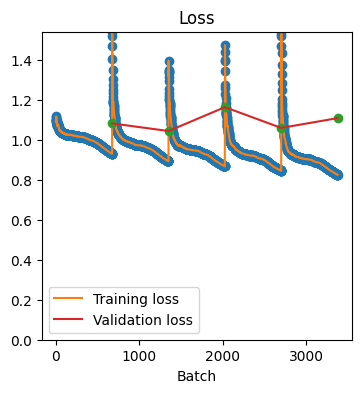

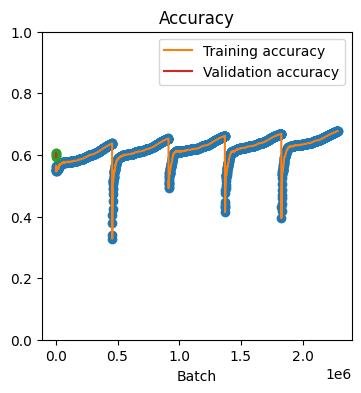

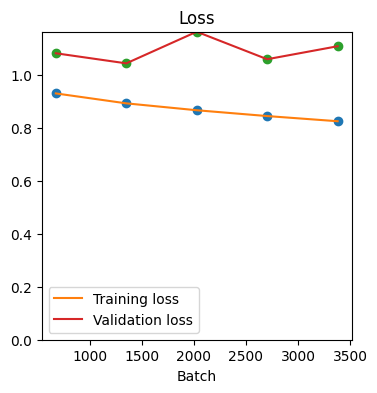

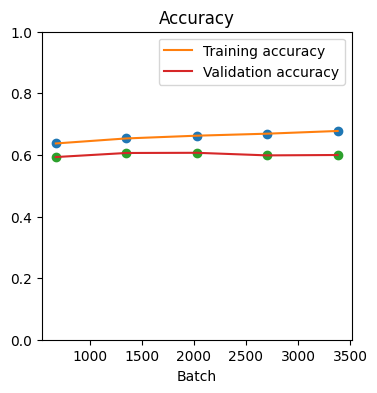

In [70]:
hist = baseline.history.history
bhist = bl_bhist

plot_history(
    [bhist.history[0], hist['val_loss']], 
    labels=['Training loss', 'Validation loss'], 
    title='Loss', 
    scaling=(1., 676.), # scales x-values: 1 for batches 676 for epoch
    offset=(0, 1) # shift x-values: validation should start at epoch 1
)
plot_history(
    [bhist.history[1], hist['val_sparse_categorical_accuracy']],
    labels=['Training accuracy', 'Validation accuracy'], 
    title='Accuracy',
    k_size=(1, 1),
    scaling=(676., 676.),
    offset=(0, 1)
)

plot_history(
    [hist['loss'], hist['val_loss']], 
    labels=['Training loss', 'Validation loss'], 
    title='Loss', 
    scaling=(676., 676.), # scales x-values: 1 for batches 676 for epoch
    offset=(1, 1) # shift x-values: validation should start at epoch 1
)
plot_history(
    [hist['sparse_categorical_accuracy'], hist['val_sparse_categorical_accuracy']],
    labels=['Training accuracy', 'Validation accuracy'], 
    title='Accuracy',
    k_size=(1, 1),
    scaling=(676., 676.),
    offset=(1, 1)
)

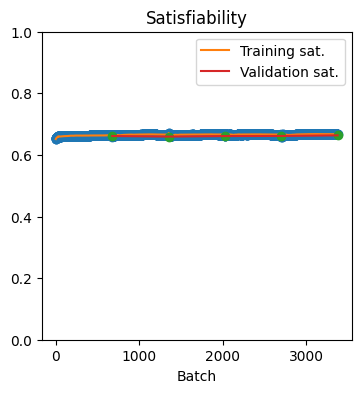

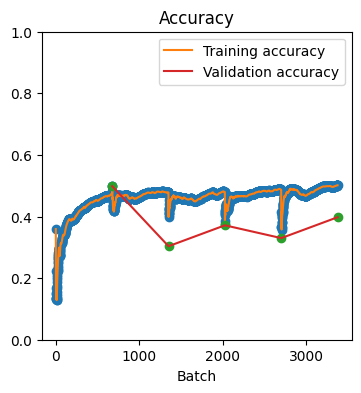

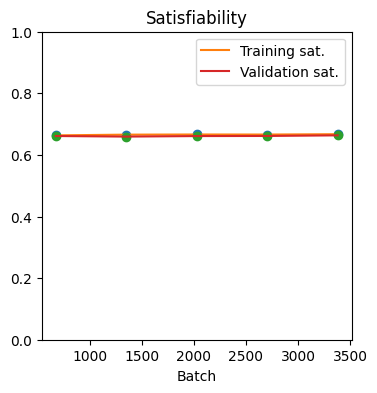

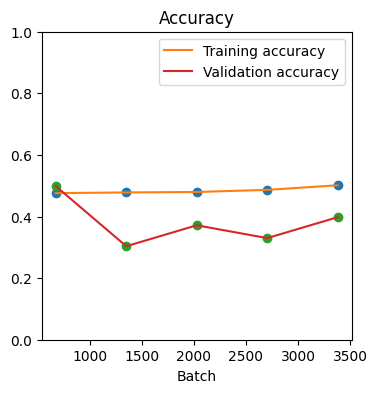

In [94]:
hist = ltn_model.history.history
bhist = ltn_bhist

plot_history(
    [bhist.history[0], hist['val_sat']], 
    labels=['Training sat.', 'Validation sat.'], 
    title='Satisfiability', 
    scaling=(1., 676.), # scales x-values: 1 for batches 676 for epoch
    offset=(0, 1) # shift x-values: validation should start at epoch 1
)
plot_history(
    [bhist.history[1], hist['val_emo_acc']],
    labels=['Training accuracy', 'Validation accuracy'], 
    title='Accuracy',
    k_size=(1, 1),
    scaling=(1., 676.),
    offset=(0, 1)
)

plot_history(
    [hist['sat'], hist['val_sat']], 
    labels=['Training sat.', 'Validation sat.'], 
    title='Satisfiability', 
    scaling=(676., 676.), # scales x-values: 1 for batches 676 for epoch
    offset=(1, 1) # shift x-values: validation should start at epoch 1
)
plot_history(
    [hist['emo_acc'], hist['val_emo_acc']],
    labels=['Training accuracy', 'Validation accuracy'], 
    title='Accuracy',
    k_size=(1, 1),
    scaling=(676., 676.),
    offset=(1, 1)
)

In [102]:
for a, l_v, l_a, l_e in ds_val_ltn.take(1):
    e_pred, _, _ = ltn_model(a)
    for y, e in zip(e_pred, l_e):
        print(np.argmax(y.numpy()), e.numpy())
    print('acc:', np.sum([1 if np.argmax(y)==e else 0 for y, e in zip(e_pred, l_e)])/BATCH_SIZE)

0 0
3 0
1 0
0 0
3 1
1 0
1 0
1 0
2 3
2 0
0 0
1 0
0 0
0 0
3 0
1 0
1 0
0 3
0 0
2 0
2 0
2 2
0 0
3 0
2 0
1 0
0 0
0 0
1 1
1 1
2 1
3 1
3 1
0 0
3 0
2 0
3 2
0 1
2 3
1 1
2 0
0 0
2 0
0 1
1 1
1 0
0 0
0 0
3 0
0 1
1 0
2 0
0 2
0 0
2 3
0 1
0 0
3 0
0 0
2 1
2 2
0 0
1 0
0 1
0 1
0 1
3 3
2 1
3 1
0 3
1 0
1 0
0 0
1 0
0 0
0 1
0 0
2 1
2 3
0 0
0 0
0 1
1 0
1 0
1 0
2 0
1 3
0 0
2 0
2 2
0 1
0 0
0 0
2 0
3 0
0 0
2 0
1 0
1 0
1 0
0 0
1 0
3 0
1 0
2 0
1 0
3 0
3 0
2 0
0 0
0 0
0 1
3 0
0 0
0 0
0 0
3 0
1 0
0 0
1 3
0 0
2 2
2 1
3 0
1 0
0 1
2 2
1 0
acc: 0.34375


# References

1. Yu, Liang-Chih & Lee, Lung-Hao & Hao, Shuai & Wang, Jin & He, Yunchao & Hu, Jun & Lai, K. & Zhang, Xuejie. (2016). Building Chinese Affective Resources in Valence-Arousal Dimensions. 10.18653/v1/N16-1066.
2. W. Dai, C. Dai, S. Qu, J. Li and S. Das, "Very deep convolutional neural networks for raw waveforms," 2017 IEEE International Conference on Acoustics, Speech and Signal Processing (ICASSP), 2017, pp. 421-425, doi: 10.1109/ICASSP.2017.7952190.